# **Assignment 2: Content Analysis and Regression**

For this assignment, you need to test a hypothesis using multiple linear regression. Before doing that, you also need to use computational content analysis and NLP techniques to create new variables that you will use as a predictor in the regression model.

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
colab_directory_path = '/content/gdrive/MyDrive/riveter-test'

In [3]:
%cd /content/gdrive/MyDrive/riveter-test/riveter-nlp/riveter


/content/gdrive/MyDrive/riveter-test/riveter-nlp/riveter


In [4]:
!pip install -U spacy-experimental

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 669.5/669.5 kB 4.7 MB/s eta 0:00:00


In [5]:
!pip install https://github.com/explosion/spacy-experimental/releases/download/v0.6.0/en_coreference_web_trf-3.4.0a0-py3-none-any.whl#egg=en_coreference_web_trf

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 490.3/490.3 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 23.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.5/53.5 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 919.6/919.6 kB 61.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.3/47.3 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 104.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 46.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.0/314.0 kB 35.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 51.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 70.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 58.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━

In [6]:
!python -m spacy download en_core_web_sm

2024-03-15 22:01:45.582506: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-15 22:01:45.582605: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-15 22:01:45.706329: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-15 22:01:45.954902: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-15 22:01:47.842592: W tensorflow/compiler/tf2

In [7]:
!pip install seaborn

##**Research Background**##

According to Chatman (1980), characters are constructs within abstracted narratives, described through networks of personality traits (e.g., Sarrasine is feminine, Othello is jealous, Roland Deschain is brave). Docherty characterizes the process of depicting and interpreting characters in literature as 'characterization' (cited by Bennett and Royle, 2017). Reaske (1996) identifies several devices of characterization, including character appearance, asides and soliloquies, dialogue, hidden narration, language, and actions performed. Characterization is crucial in narrative because it allows readers to relate to characters and feel emotionally engaged in the story (Cohen, 2001). providing information on personalities and behaviors for gender representation analysis in fiction.

For this assignment, you'll work with a corpus of the genre Real Person Fiction (RPF), where characters are characterized by blending real-life traits with fans' interpretations and reimagination, reflecting societal and cultural trends.

On the online fanfiction platform AO3, fanfictions about the Korean boy band BTS represent the largest fandom, surpassing even the Marvel Universe and Harry Potter franchises. Research into the global popularity of the Korean Wave (*Hallyu*) has highlighted the concept of "manufactured versatile masculinity" exhibited by male K-pop idols, a blend of softer, more effeminate appearances or behaviors with traditional forms of hegemonic masculinity, described by scholars such as Jung (2011), Kuo et al. (2020), Kwon (2019), and Oh (2015). Oh (2015) terms this "liminal masculinity," with androgynous K-pop male idols crossing gender lines.

**Aim:**

This assignment aims to analyze the impact of soft masculinity on K-pop fanfiction's success using a corpus of 100 BTS fanfictions.

**Data:**

We will utilize a dataset from the GOLEM project, comprising 100 BTS-related fanfictions, including story ID, publication year, word count, kudos, comments, and story content in English (1,000 to 1,200 words).

**Methods:**
- operationalize the concept of 'soft masculinity' to make it measurable
- use regression analysis to test a hypothesis

In [9]:
# Load and check the dataset
import pandas as pd

df = pd.read_csv('/content/gdrive/MyDrive/BTS_short_100.csv', encoding="UTF-8")
df.head()

,story_id,published_year,words,kudos,comments,story_content
0,4706144,2015,1185,249.0,1.0,library snacks & 3AM promises\n\nAuthor's Note...
1,4752980,2015,1164,79.0,NaN,Worry\n\nYou stumbled through the apartment do...
2,4706144,2015,1185,249.0,1.0,library snacks & 3AM promises\n\nAuthor's Note...
3,4621698,2015,1016,105.0,4.0,Mornings\n\nThis is literally trash omg what I...
4,4752980,2015,1164,79.0,NaN,Worry\n\nYou stumbled through the apartment do...


Have you noticed something odd in the first five lines of this dataset?

There are some duplicates.

So first we need to do some data cleaning, checking how many rows are duplicated and deleting the duplicates.


In [10]:
# Get the number of unique rows
unique_story_ids = df['story_id'].nunique()

# Print the result
print(f"The number of unique 'story_id' values is: {unique_story_ids}")

The number of unique 'story_id' values is: 90


In [11]:
# Remove duplicate rows
df = df.drop_duplicates()

df.head()

,story_id,published_year,words,kudos,comments,story_content
0,4706144,2015,1185,249.0,1.0,library snacks & 3AM promises\n\nAuthor's Note...
1,4752980,2015,1164,79.0,NaN,Worry\n\nYou stumbled through the apartment do...
3,4621698,2015,1016,105.0,4.0,Mornings\n\nThis is literally trash omg what I...
5,3651108,2015,1174,339.0,6.0,Purple Gel Pens\n\nAuthor's Note:\n\nwtf is th...
7,5282729,2015,1173,17.0,NaN,"Unspoken Words\n\nYou come back into the flat,..."


In [12]:
# Let's check how many rows there are now
df.shape[0]

90

##**Research Design**##
The steps of this research involve formulating a hypothesis, selecting `kudos` as a proxy for the success of a story -- the dependent variable (Y) -- and calculating a masculinity score to be used as the independent variable (x1). We will also use additional variables that are also likely to have an effect on the success of a story: `publication_year` (x2) - because AO3 user base has grown in time and more recent stories are more likely to receive more kudos simply becasue there are more readers on the platform - and lexical richness (x3) - because it's plausible that a story with a richer vocabulary also has a better style and, therefore, it's liked more by readers.

Note that we don't have variables for `masculinity_score` and `lexical_richness` yet, so we need to calculate them from the text of the stories.

The hypothesis states:

H1: Low levels of masculinity in male characters positively affects fanfiction success when controlling for publication year and lexical richness.

**H0: What is the null hypothesis?**

In [ ]:
# H0 (answer in words):
'''
There is no relationship between levels of masculinity in male characters and the success of fanfiction stories,
when controlling for publication year and lexical richness.
'''

##**Compute Masculinity Score**##

To calculate a sterotypical masculinity score, we can refer to older theories of perceived gender identity that probably define gender roles in a stereotypical way. an example of this is the Bem Sex-Role Inventory (BSRI) by Dr. Sandra Lipzits Bem (1974), which classifies personality traits into masculine, feminine, and androgynous.

Bem divides personal traits into 60 traits: 20 masculine traits, 20 feminine traits and 20 neutral traits (see figure below).


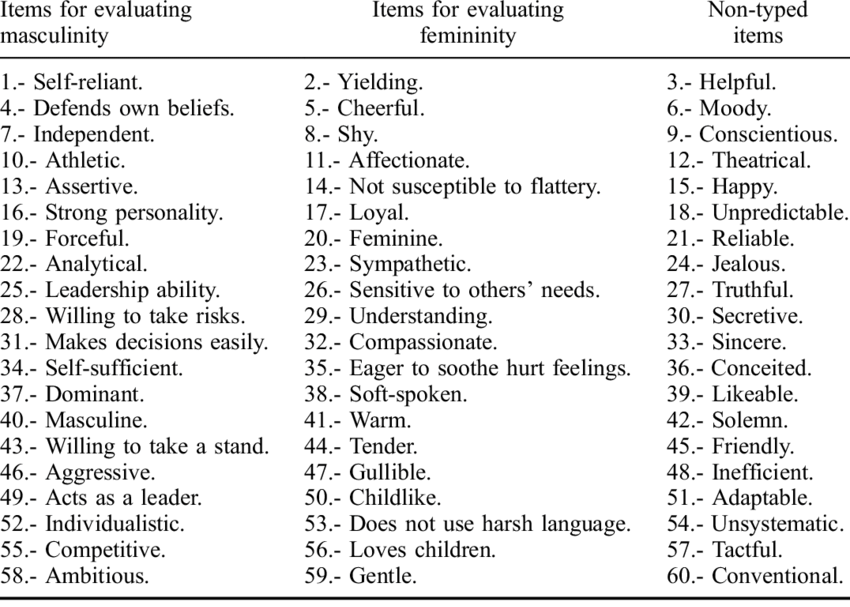

The above list shows that, despite recent discussions about masculinity, femininity, and gender roles have become more diversified, traditional definitions such as those provided by the Bem Sex-Role Inventory (BSRI) can be useful to detect gender stereotypes. Within the definitions of masculinity and femininity outlined by the BSRI, we observe a clear power imbalance: masculinity is associated with dominance (e.g., assertive, strong personality, forceful, leadership ability, dominant, aggressive, ambitious), while femininity leans towards submissiveness (e.g., yielding, understanding, tender). Therefore, we can consider employing the power-agent frames designed by Sap et al. to compute a power score for the male characters in the fanfiction stories. Lower masculinity scores can be plausibly associated with a representation of 'soft masculinity' in relation to a character.

###**Riveter**###

In the W5 lab, we have already gained preliminary experience with the Riveter pipeline.

In this section, we will use utilize the Riveter pipeline with Sap's power-agent frames to calculate the `masculinity_score` for identifiable agents in the text. Since we are interested only in the masculinity of male characters, we will use regular expressions to identify male pronouns (he, him, himself) and calculate their corresponding `masculinity_score`. This score will be added to the df as a new column.


In [ ]:
# Set up everything you need to use Riveter, following the notebook we used in W5 lab
# No need to put the code here, as long as it's working
# We assume that you have installed all the required packages, either locally or on Colab

Now we have prepared all the dependencies needed.

In [13]:
from collections import defaultdict
import os
import pandas as pd
import random
from riveter import Riveter # if the notebook is not in the /riveter folder, this will throw an error

import seaborn as sns
import matplotlib.pyplot as plt

**Prepare the corpus**:

First, we can try to initialize two lists to store `story_content` and `story_id`, but this will casue the problem below:

`Token indices sequence length is longer than the specified maximum sequence length for this model (574 > 512).`

This is a limit of the language model (BERT) used by Riveter. We need to split the file into smaller chunks in order for it to be processed correctly. The example in the original Riveter notebook where they load *Pride and Prejudice* shows how we can do this. The code is also provided here below.




In [34]:
def split_text_into_segments(text, max_length=512):
    """
    Segment the text so that each segment contains a maximum of max length tokens.
    """
    segments = []
    current_segment = []
    for word in text.split():
        if len(current_segment) + len(word.split()) <= max_length:
            current_segment.append(word)
        else:
            segments.append(' '.join(current_segment))
            current_segment = [word]
    if current_segment:
        segments.append(' '.join(current_segment))
    return segments

Let's first initialize Riveter with the lexicon that we are going to use:

In [46]:
# Q0 (code): Load lexicon 'power' and create an empty dictionary called 'scores_dict'

riveter = Riveter()
riveter.load_sap_lexicon('power')
scores_dict = {}

# Train Riveter specifying 'persona_patterns_dict' to assign scores only based on male pronouns
riveter.train(text_ids, story_content, persona_patterns_dict={'masculine': ['he', 'him', 'himself']})

# Iterate over each row in the dataframe
for index, row in tqdm(df.iterrows(), total=df.shape[0], desc="Processing stories"):
    story_id = row['story_id']
    story_content = row['story_content']

    # Apply the function of splitting
    segments = split_text_into_segments(story_content)
    text_ids = [f"{story_id}_{i}" for i in range(len(segments))]

    # Get the persona score dictionary
    persona_score_dict = riveter.get_score_totals()

    # Get the masculine score for the current story
    masculine_score = persona_score_dict.get('masculine', 0)

    # Print feedback about the computed scores while the code is running
    print(f"Story ID: {story_id}, Masculine Power Score: {masculine_score}")

    # Store the score of each story in the dictionary
    scores_dict[story_id] = masculine_score

# Add the scores to the dataframe
df['masculine_power_score'] = df['story_id'].map(scores_dict)


100%|██████████| 3/3 [00:00<00:00, 11.64it/s]


2024-03-15 22:40:50 Complete!


Processing stories: 100%|██████████| 90/90 [00:00<00:00, 2353.88it/s]

Story ID: 4706144, Masculine Power Score: 0
Story ID: 4752980, Masculine Power Score: 0
Story ID: 4621698, Masculine Power Score: 0
Story ID: 3651108, Masculine Power Score: 0
Story ID: 5282729, Masculine Power Score: 0
Story ID: 5533886, Masculine Power Score: 0
Story ID: 4547622, Masculine Power Score: 0
Story ID: 16177508, Masculine Power Score: 0
Story ID: 15745185, Masculine Power Score: 0
Story ID: 15654528, Masculine Power Score: 0
Story ID: 7448155, Masculine Power Score: 0
Story ID: 4983847, Masculine Power Score: 0
Story ID: 3313118, Masculine Power Score: 0
Story ID: 3290390, Masculine Power Score: 0
Story ID: 36435301, Masculine Power Score: 0
Story ID: 36575491, Masculine Power Score: 0
Story ID: 35225224, Masculine Power Score: 0
Story ID: 4594527, Masculine Power Score: 0
Story ID: 5485625, Masculine Power Score: 0
Story ID: 36408319, Masculine Power Score: 0
Story ID: 35762659, Masculine Power Score: 0
Story ID: 35603194, Masculine Power Score: 0
Story ID: 35344306, Mas

Now we can apply the splitting function we defined above and then use Riveter on our corpus. To do this, we need to create a loop that iterates through all the rows in the dataframe and compute scores for each story.

**Q1. Train Riveter to assign scores to text based on male pronouns**

In [43]:
from tqdm import tqdm # used to display a progress bar when executing code

for index, row in tqdm(df.iterrows(), total=df.shape[0], desc="Processing stories"):
    story_id = row['story_id']
    story_content = row['story_content']

    # apply the splitting function:
    segments = split_text_into_segments(story_content)
    text_ids = [f"{story_id}_{i}" for i in range(len(segments))]

    # Q1 (code): train riveter specifying 'persona_patterns_dict= ' to assign scores only based on male pronouns
    # write code below:

    # store the computed scores in a dictionary
    persona_score_dict = riveter.get_score_totals()
    masculine_score = persona_score_dict.get('masculine', 0)

    # get a feedback about the computed scores while the code is running
    print(f"Story ID: {story_id}, Masculine Power Score: {masculine_score}")

    # store the score of each story in the same dictionary so that we can then add it to the dataframe
    scores_dict[story_id] = masculine_score

# add the dictionary of scores to the dataframe
df['masculine_power_score'] = df['story_id'].map(scores_dict)

Processing stories: 100%|██████████| 90/90 [00:00<00:00, 2149.35it/s]

Story ID: 4706144, Masculine Power Score: 0
Story ID: 4752980, Masculine Power Score: 0
Story ID: 4621698, Masculine Power Score: 0
Story ID: 3651108, Masculine Power Score: 0
Story ID: 5282729, Masculine Power Score: 0
Story ID: 5533886, Masculine Power Score: 0
Story ID: 4547622, Masculine Power Score: 0
Story ID: 16177508, Masculine Power Score: 0
Story ID: 15745185, Masculine Power Score: 0
Story ID: 15654528, Masculine Power Score: 0
Story ID: 7448155, Masculine Power Score: 0
Story ID: 4983847, Masculine Power Score: 0
Story ID: 3313118, Masculine Power Score: 0
Story ID: 3290390, Masculine Power Score: 0
Story ID: 36435301, Masculine Power Score: 0
Story ID: 36575491, Masculine Power Score: 0
Story ID: 35225224, Masculine Power Score: 0
Story ID: 4594527, Masculine Power Score: 0
Story ID: 5485625, Masculine Power Score: 0
Story ID: 36408319, Masculine Power Score: 0
Story ID: 35762659, Masculine Power Score: 0
Story ID: 35603194, Masculine Power Score: 0
Story ID: 35344306, Mas

**Q2. Print a sample of the dataframe to check whether the `masculine_power_score` has been added correctly**

In [44]:
# Q2 (code)
print(df.sample(5))

    story_id  published_year  words  kudos  comments  \
45  35138911            2021   1148    4.0       2.0   
94  12610496            2017   1095   19.0       NaN   
3    4621698            2015   1016  105.0       4.0   
98  11962824            2017   1048  135.0       6.0   
32  35344306            2022   1116   43.0       2.0   

                                        story_content  masculine_power_score  
45  you taught me the courage of stars (before you...                      0  
94  started from the bottom (now we're here)\n\nAu...                      0  
3   Mornings\n\nThis is literally trash omg what I...                      0  
98  Letters to Jungkook\n\nAuthor's Note:\n\nI don...                      0  
32  hot tubs (and cookie crumbs)\n\nAuthor's Note:...                      0  


In [47]:
# If you use google colab, it's better to save this result locally in case the connection breaks and then you lose the result.
df.to_csv('/content/df.csv', index=False)

##**Compute Lexical Richness Score**##

'Lexical richness' refers to the range and variety of vocabulary deployed in a text by a speaker/writer. 'Lexical richness' is a term used interchangeably with 'lexical diversity', 'lexical variation', 'lexical density', and 'vocabulary richnes', and it's measured by a wide variety of indices. Uses include (but are not limited to) measuring writing quality, vocabulary knowledge, speaker competence, and socioeconomic status.


The type-token ratio (TTR) is a simple measure of lexical diversity within a text. It is calculated by dividing the number of unique words (types) by the total number of words (tokens) in the given text. A higher TTR indicates a greater variety of vocabulary, suggesting richer lexical content. Conversely, a lower TTR suggests more repetitive use of vocabulary. TTR is often used to assess the lexical complexity of written or spoken material.

Here we use the package `lexicalrichness` (https://pypi.org/project/lexicalrichness/) to compute type-token ratio (TTR) for each story as a control on their language quality.

In [48]:
!pip install lexicalrichness

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.8/97.8 kB 1.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lexicalrichness: filename=lexicalrichness-0.5.1-py3-none-any.whl size=15417 sha256=370d3c690c14297653811ae8230a1139d28af7b6aaf8d70e275475cd4d013069
  Stored in directory: /root/.cache/pip/wheels/cd/ba/80/d4dabc1bf242a672ffc00226a2303a7471bb841c0872b2c212
Successfully built lexicalrichness


In [49]:
from lexicalrichness import LexicalRichness

# Define a function that calculates the lexical richness of the text
def calculate_lexical_richness(text):
    # Create a LexicalRichness object for the text
    lex = LexicalRichness(text)
    # Compute type-token ratio (TTR)
    return lex.ttr  # Returns the type-token ratio

# Apply the function to the 'story content' column in the DataFrame
df['lexical_richness'] = df['story_content'].apply(calculate_lexical_richness)

# Display the DataFrame with the new 'lexical_richness' column
df.head()

,story_id,published_year,words,kudos,comments,story_content,masculine_power_score,lexical_richness
0,4706144,2015,1185,249.0,1.0,library snacks & 3AM promises\n\nAuthor's Note...,0,0.428571
1,4752980,2015,1164,79.0,NaN,Worry\n\nYou stumbled through the apartment do...,0,0.400665
3,4621698,2015,1016,105.0,4.0,Mornings\n\nThis is literally trash omg what I...,0,0.428986
5,3651108,2015,1174,339.0,6.0,Purple Gel Pens\n\nAuthor's Note:\n\nwtf is th...,0,0.412295
7,5282729,2015,1173,17.0,NaN,"Unspoken Words\n\nYou come back into the flat,...",0,0.376110


Now that we have both the two new variables added to the dataframe, we have all we need to test our hypothesis with linear regression.

##**Regressions**##


**Methodology**

- Multiple Linear Regression: Perform a regression analysis with `kudos` as the dependent variable and `masculine_power_score`, `published_year`, and `words` as independent variables.
- Residual Analysis: Conduct normality and homoscedasticity tests on the residuals to validate the assumptions of linear regression.
- Model Evaluation: Assess the model using adjusted R-squared, F-test, and t-tests for individual coefficients.
- Multicollinearity Check: Calculate the Variance Inflation Factor (VIF) for the independent variables to detect possible multicollinearity.

**Q3. Check the data distribution and handle missing values**


Summary statistics for numerical variables:
           story_id  published_year        words        kudos   comments  \
count  9.000000e+01       90.000000    90.000000    89.000000  65.000000   
mean   1.839576e+07     2018.088889  1094.344444   135.393258   6.923077   
std    1.307922e+07        2.612177    55.327048   229.972311   7.005149   
min    1.572659e+06     2014.000000  1002.000000     1.000000   1.000000   
25%    7.448760e+06     2016.000000  1042.250000    20.000000   2.000000   
50%    1.224167e+07     2017.000000  1095.000000    54.000000   5.000000   
75%    3.517148e+07     2021.000000  1141.750000   122.000000   9.000000   
max    3.736347e+07     2022.000000  1194.000000  1190.000000  36.000000   

       masculine_power_score  lexical_richness  
count                   90.0         90.000000  
mean                     0.0          0.405027  
std                      0.0          0.037109  
min                      0.0          0.264443  
25%                      0

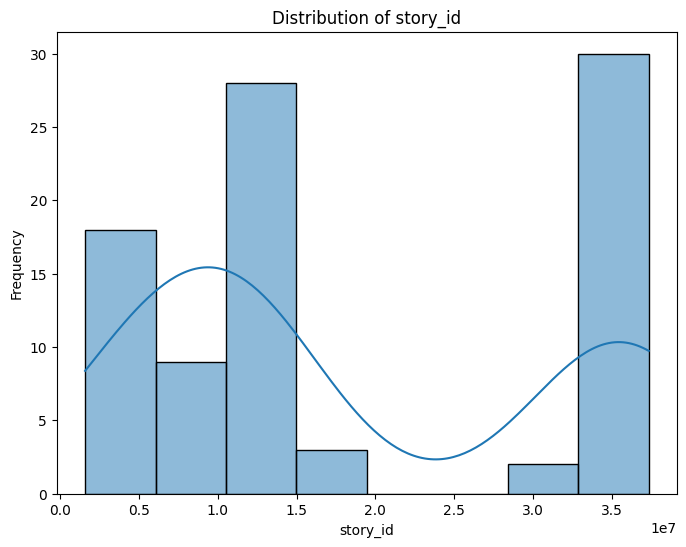

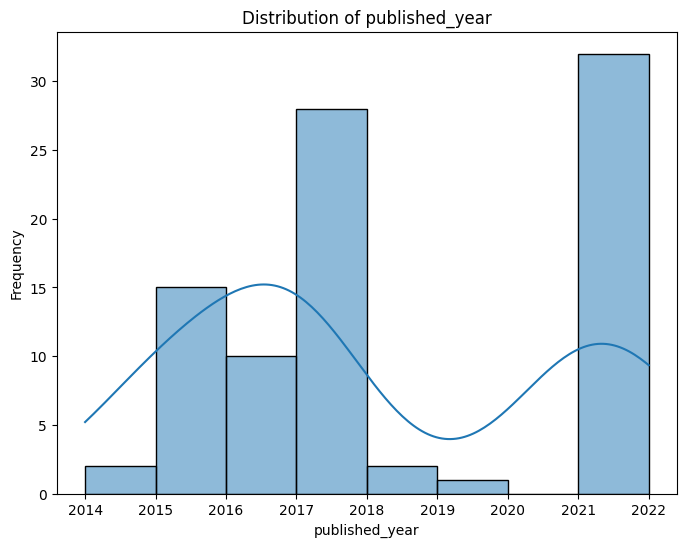

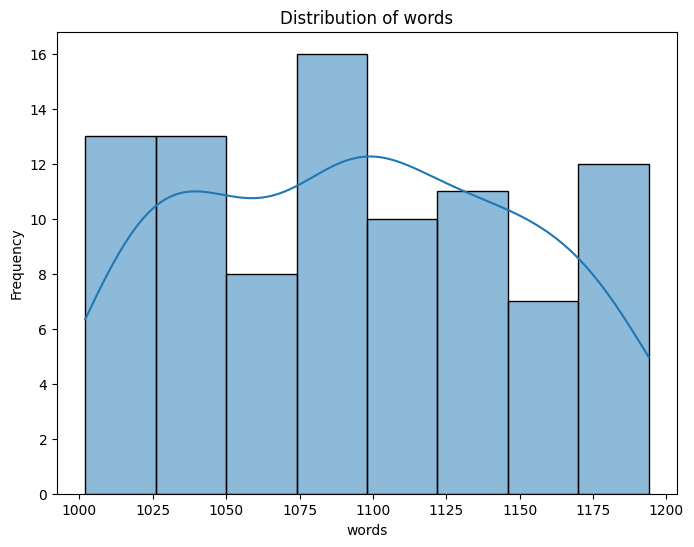

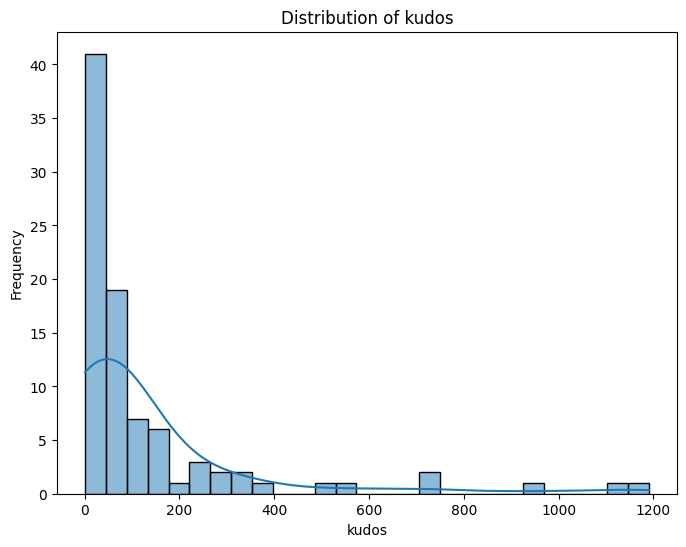

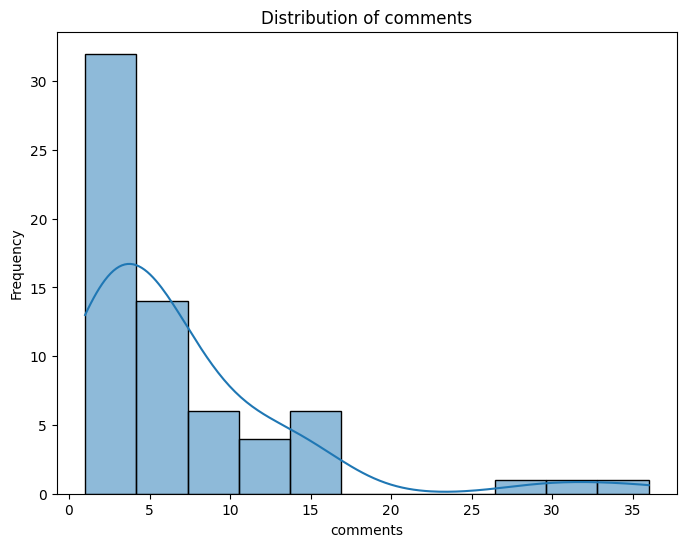

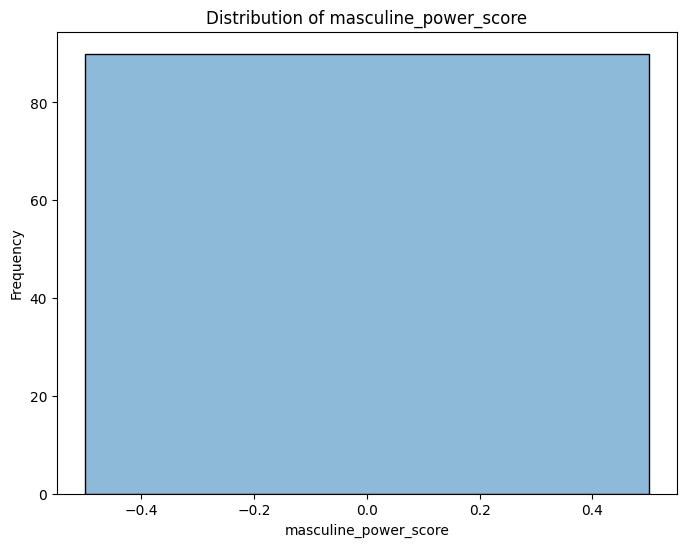

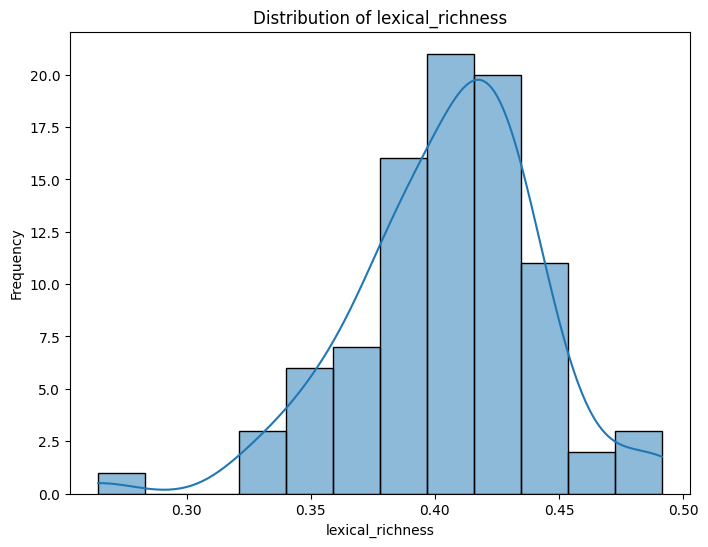


Data distribution for categorical variables:


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48169 (\N{HANGUL SYLLABLE BANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 53444 (\N{HANGUL SYLLABLE TAN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49548 (\N{HANGUL SYLLABLE SO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 45380 (\N{HANGUL SYLLABLE NYEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 45800 (\N{HANGUL SYLLABLE DAN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-package

In [51]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming the DataFrame is named 'df'

# Show summary statistics for numerical variables.
print("Summary statistics for numerical variables:")
print(df.describe())

# Visualize the distribution of numerical variables using histograms.
print("\nData distribution for numerical variables:")
numerical_cols = df.select_dtypes(include=['int', 'float']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# Display data distribution for categorical variables using bar plots
print("\nData distribution for categorical variables:")
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(8, 6))
    sns.countplot(df[col])
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.show()

In [52]:
# Q3b (code): compute some descriptive statistics

# Compute descriptive statistics
descriptive_stats = df.describe()

# Display descriptive statistics
print(descriptive_stats)

           story_id  published_year        words        kudos   comments  \
count  9.000000e+01       90.000000    90.000000    89.000000  65.000000   
mean   1.839576e+07     2018.088889  1094.344444   135.393258   6.923077   
std    1.307922e+07        2.612177    55.327048   229.972311   7.005149   
min    1.572659e+06     2014.000000  1002.000000     1.000000   1.000000   
25%    7.448760e+06     2016.000000  1042.250000    20.000000   2.000000   
50%    1.224167e+07     2017.000000  1095.000000    54.000000   5.000000   
75%    3.517148e+07     2021.000000  1141.750000   122.000000   9.000000   
max    3.736347e+07     2022.000000  1194.000000  1190.000000  36.000000   

       masculine_power_score  lexical_richness  
count                   90.0         90.000000  
mean                     0.0          0.405027  
std                      0.0          0.037109  
min                      0.0          0.264443  
25%                      0.0          0.384458  
50%                  

In [53]:
# Q3c (code): Check for any missing values

missing_values = df.isnull().sum()

# Display missing values
print("Missing values in the DataFrame:")
print(missing_values)

Missing values in the DataFrame:
story_id                  0
published_year            0
words                     0
kudos                     1
comments                 25
story_content             0
masculine_power_score     0
lexical_richness          0
dtype: int64


In [55]:
# Q3d (code): replace all the NA values with zeros and check again Q3c

# Replace all NA values with zeros
df.fillna(0, inplace=True)

# Check missing values again
missing_values_after_replacement = df.isnull().sum()

# Display missing values after replacement
print("Missing values after replacing NA with zeros:")
print(missing_values_after_replacement)

Missing values after replacing NA with zeros:
story_id                 0
published_year           0
words                    0
kudos                    0
comments                 0
story_content            0
masculine_power_score    0
lexical_richness         0
dtype: int64


It's always important to visualize the data to inspect the distributions of values for the variables your interested in (do you remember the dinosaur data shown in class?).

**Q4. Create a scatterplot with `masculine_power_score` and `kudos`**

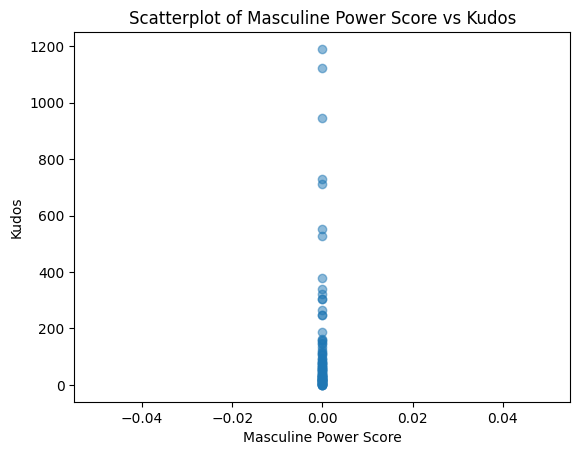

In [56]:
# Q4 (code): Create a scatterplot with masculine_power_score and kudos

import matplotlib.pyplot as plt

# Create scatterplot
plt.scatter(df['masculine_power_score'], df['kudos'], alpha=0.5)
plt.xlabel('Masculine Power Score')
plt.ylabel('Kudos')
plt.title('Scatterplot of Masculine Power Score vs Kudos')
plt.show()


**Q5. Multiple Regression and Analysis**

In [58]:
# Q5 (code): Do OLS Multiple Regression and print the regression result summary

import statsmodels.api as sm

# Define independent variables (X) and dependent variable (y)
X = df[['masculine_power_score', 'published_year', 'words']]
y = df['kudos']

# Add constant term to the independent variables
X = sm.add_constant(X)

# Fit the OLS regression model
model = sm.OLS(y, X).fit()

# Print the result summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  kudos   R-squared:                       0.162
Model:                            OLS   Adj. R-squared:                  0.143
Method:                 Least Squares   F-statistic:                     8.404
Date:                Fri, 15 Mar 2024   Prob (F-statistic):           0.000460
Time:                        22:49:39   Log-Likelihood:                -608.34
No. Observations:                  90   AIC:                             1223.
Df Residuals:                      87   BIC:                             1230.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  7.047e+

**Q6. Interpret the results of the regression analysis**

In [ ]:
# Q6a (words): Interpret the R-squared and Adj. R-squared
'''R-squared (R²) indicates how well the independent variables explain the variation in the dependent variable.
Adjusted R-squared (Adj. R²) considers the number of predictors in the model and provides a more accurate measure of model fit.'''

In [ ]:
# Q6b (words): Interpret F-test result
'''The F-test assesses whether the overall regression model is statistically significant.
If the p-value associated with the F-test is less than a chosen significance level (typically 0.05), it suggests that the regression model as a whole is a good fit for the data, indicating that at least one of the independent variables has a significant effect on the dependent variable.
'''

In [ ]:
# Q6c (words): Interpret coefficients and t-test result
''' The coefficients indicate the direction and magnitude of the relationship between the independent and dependent variables.
The associated t-test determines if these coefficients are statistically significant.'''

Based on the OLS regression results provided, here is an example analysis:

The model's R-squared value of 0.162 indicates that approximately 16.2% of the variability in the kudos can be explained by the model. While this suggests that the model explains a portion of the variability, there remains a significant amount unaccounted for, which might be explained by factors not included in the model.

The adjusted R-squared value of 0.133 takes into account the number of predictors in the model and the number of observations, showing a slight decrease from the R-squared value, which is normal as it adjusts for the number of terms in the model.

Looking at the coefficients:

const (6.995e+04): The constant term is significantly different from zero, which may represent the base number of kudos when all other variables are held at zero.
masculine_power_score (59.7927): This variable is not statistically significant (p-value 0.668) with a wide confidence interval, suggesting that the masculine power score does not significantly impact the number of kudos in the given dataset.
lexical_richness (390.3633): Similar to the masculine power score, lexical richness does not appear to significantly affect the number of kudos (p-value 0.524).
published_year (-34.6801): This is the only variable with a statistically significant coefficient (p-value < 0.001), indicating that more recent stories tend to have fewer kudos.
The large F-statistic (5.561) and its associated low probability (0.00155) suggest that the overall model is statistically significant compared to a model without any predictors.

**Q7: Residual Analysis**

Normality Test, Homoscedasticity Test

In [60]:
# Q7a (code): Calculate residuals and do a Shapiro-Wilk Test

import statsmodels.api as sm
from scipy import stats

In [ ]:
# Q7b (words): Write your analysis for the Normality Test there:


In [ ]:
# Q7c (code): Homoscedasticity Test (plot residuals vs. predictions)


In the residuals vs. predicted values plot, you would look for patterns. In a well-fitted model, you would expect to see the residuals randomly scattered around zero, with no clear pattern. The presence of a pattern might suggest issues with model specification, such as non-linearity or heteroscedasticity.

In [ ]:
# Q7d (words): Write your analysis for the Homoscedasticity Test here:


**Q8: Multicollinearity**

In [ ]:
# Q8a (code)
from statsmodels.stats.outliers_influence import variance_inflation_factor


Regarding multicollinearity, the VIF values for masculine_power_score, lexical_richness, and published_year are close to 1, which suggests low multicollinearity. However, the very high VIF for the const term, along with the large condition number, suggests that there may be numerical issues, possibly due to a large scale difference between predictors or multicollinearity issues not captured by standard VIF calculations.

In [ ]:
# Q8b (words): Write your analysis for the multicollinearity test here:


**Q9: Reflection**

In [ ]:
# Q9 (words): Write your reflection on the whole research framework and corresponding result here, e.g., what do you think can be improved?


##**Reference:**##

Seymour Benjamin Chatman. 1980. Story and Discourse: Narrative Structure in Fiction and Film. Cornell University Press, Ithaca, NY, USA.

Bennet, Andrew, and Nicholas Royle. Introduction to Literature Criticism and Theory. Edinburgh: Pearson Education Limited, 2004.Web.July. 2017.

Reaske, Christoper Russel. Analyze Drama. New York: Monarch Press, 1996. Print.

Jung, Sun “Bae Yong-Joon, Soft Masculinity, and Japanese Fans: Our Past Is in Your Present Body” from Korean Masculinities and Transcultural Consumption, Hong Kong Scholarship Online, 2010.

Kuo, Linda, et al., “Performance, Fantasy, or Narrative: LGBTQ+ Asian American Identity through Kpop Media in Fandom”, Journal of Homosexuality, 2020.

Kwon, Jungmin, Straight Korean Female Fans and Their Gay Fantasies, University of Iowa Press, 2019, ebook.

Oh, Chuyun, “Queering spectatorship in K-pop: The androgynous male dancing body and western female fandom”, Journal of Fandom Studies, vol. 3, no. 1, 2015, pp. 59-78.